In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("Global_Education_Dataset_UAS.csv")
df.head()

,Countries and areas,Latitude,Longitude,OOSR_Pre0Primary_Age_Male,OOSR_Pre0Primary_Age_Female,OOSR_Primary_Age_Male,OOSR_Primary_Age_Female,OOSR_Lower_Secondary_Age_Male,OOSR_Lower_Secondary_Age_Female,OOSR_Upper_Secondary_Age_Male,...,Primary_End_Proficiency_Reading,Primary_End_Proficiency_Math,Lower_Secondary_End_Proficiency_Reading,Lower_Secondary_End_Proficiency_Math,Youth_15_24_Literacy_Rate_Male,Youth_15_24_Literacy_Rate_Female,Birth_Rate,Gross_Primary_Education_Enrollment,Gross_Tertiary_Education_Enrollment,Unemployment_Rate
0,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,44,...,13,11,0,0,74,56,32.49,very high,extremely low,moderately low
1,Albania,41.153332,20.168331,4,2,6,3,6,1,21,...,0,0,48,58,99,100,11.78,very high,moderately low,moderate
2,Algeria,28.033886,1.659626,0,0,0,0,0,0,0,...,0,0,21,19,98,97,24.28,very high,moderately low,moderately low
3,Andorra,42.506285,1.521801,0,0,0,0,0,0,0,...,0,0,0,0,0,0,7.20,very high,extremely low,extremely low
4,Angola,11.202692,17.873887,31,39,0,0,0,0,0,...,0,0,0,0,0,0,40.73,very high,extremely low,low


Countries and Areas: The name of the country or geographic area. This variable is typically a string.

Latitude: The geographic latitude of the country or area, measured in degrees.

Longitude: The geographic longitude of the country or area, measured in degrees.

OOSR_Pre0Primary_Age_Male: The percentage of boys of pre-primary school age who are out of school.

OOSR_Pre0Primary_Age_Female: The percentage of girls of pre-primary school age who are out of school.

OOSR_Primary_Age_Male: The percentage of boys of primary school age who are out of school.

OOSR_Primary_Age_Female: The percentage of girls of primary school age who are out of school.

OOSR_Lower_Secondary_Age_Male: The percentage of boys of lower secondary school age who are out of school.

OOSR_Lower_Secondary_Age_Female: The percentage of girls of lower secondary school age who are out of school.

OOSR_Upper_Secondary_Age_Male: The percentage of boys of upper secondary school age who are out of school.

OOSR_Upper_Secondary_Age_Female: The percentage of girls of upper secondary school age who are out of school.

Completion_Rate_Primary_Male: The completion rate for primary education for boys. This could be a percentage or a specific category.

Completion_Rate_Primary_Female: The completion rate for primary education for girls.

Completion_Rate_Lower_Secondary_Male: The completion rate for lower secondary education for boys.

Completion_Rate_Lower_Secondary_Female: The completion rate for lower secondary education for girls.

Completion_Rate_Upper_Secondary_Male: The completion rate for upper secondary education for boys.

Completion_Rate_Upper_Secondary_Female: The completion rate for upper secondary education for girls.

Grade_2_3_Proficiency_Reading: Proficiency in reading for students in grades 2 and 3. This typically represents scores or percentages.

Grade_2_3_Proficiency_Math: Proficiency in math for students in grades 2 and 3.

Primary_End_Proficiency_Reading: Reading proficiency at the end of primary education.

Primary_End_Proficiency_Math: Math proficiency at the end of primary education.

Lower_Secondary_End_Proficiency_Reading: Reading proficiency at the end of lower secondary education.

Lower_Secondary_End_Proficiency_Math: Math proficiency at the end of lower secondary education.

Youth_15_24_Literacy_Rate_Male: Literacy rate for males aged 15-24.

Youth_15_24_Literacy_Rate_Female: Literacy rate for females aged 15-24.

Birth_Rate: Birth rate per 1,000 population.

Gross_Primary_Education_Enrollment: Gross Enrollment Ratio for primary education. Usually expressed as a percentage.

Gross_Tertiary_Education_Enrollment: Gross Enrollment Ratio for tertiary education.

Unemployment_Rate: The unemployment rate in the country or area. This may be represented as a percentage or another category.

## Data Preparation

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 202 entries, 0 to 201
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Countries and areas                      202 non-null    object 
 1   Latitude                                 202 non-null    float64
 2   Longitude                                202 non-null    float64
 3   OOSR_Pre0Primary_Age_Male                202 non-null    int64  
 4   OOSR_Pre0Primary_Age_Female              202 non-null    int64  
 5   OOSR_Primary_Age_Male                    202 non-null    int64  
 6   OOSR_Primary_Age_Female                  202 non-null    int64  
 7   OOSR_Lower_Secondary_Age_Male            202 non-null    int64  
 8   OOSR_Lower_Secondary_Age_Female          202 non-null    int64  
 9   OOSR_Upper_Secondary_Age_Male            202 non-null    int64  
 10  OOSR_Upper_Secondary_Age_Female          202 non-n

no empty value

In [4]:
print(df.shape)
print(df.duplicated().sum())

(202, 29)
0


no duplicated value

In [5]:
objects = [col for col in df.columns if (df[col].dtype=="object") and (col != "Countries and areas")]
unique = [df[col].value_counts() for col in objects]
unique

[Completion_Rate_Primary_Male
 extremely low      95
 ultra high         49
 high               15
 very high          14
 extremely high      9
 moderate            8
 moderately low      6
 moderately high     5
 low                 1
 Name: count, dtype: int64,
 Completion_Rate_Primary_Female
 extremely low      95
 ultra high         53
 extremely high     13
 very high          12
 moderately high    10
 moderately low      5
 moderate            5
 low                 4
 high                4
 very low            1
 Name: count, dtype: int64,
 Completion_Rate_Lower_Secondary_Male
 extremely low      96
 ultra high         23
 moderate           17
 moderately high    12
 extremely high     12
 high               10
 low                 9
 very high           9
 moderately low      8
 very low            6
 Name: count, dtype: int64,
 Completion_Rate_Lower_Secondary_Female
 extremely low      100
 ultra high          29
 extremely high      12
 low                 11
 moderate    

As we can see, each object feature represents a categorical variable that likely has an ordinal nature, ranging from extremely low to extremely high. Therefore, the most appropriate encoder to use would be OrdinalEncoder as it's designed to handle ordinal data by preserving the inherent order.

In [3]:
df_enco =df.drop(columns="Countries and areas")
df_enco.head(2)

,Latitude,Longitude,OOSR_Pre0Primary_Age_Male,OOSR_Pre0Primary_Age_Female,OOSR_Primary_Age_Male,OOSR_Primary_Age_Female,OOSR_Lower_Secondary_Age_Male,OOSR_Lower_Secondary_Age_Female,OOSR_Upper_Secondary_Age_Male,OOSR_Upper_Secondary_Age_Female,...,Primary_End_Proficiency_Reading,Primary_End_Proficiency_Math,Lower_Secondary_End_Proficiency_Reading,Lower_Secondary_End_Proficiency_Math,Youth_15_24_Literacy_Rate_Male,Youth_15_24_Literacy_Rate_Female,Birth_Rate,Gross_Primary_Education_Enrollment,Gross_Tertiary_Education_Enrollment,Unemployment_Rate
0,33.939110,67.709953,0,0,0,0,0,0,44,69,...,13,11,0,0,74,56,32.49,very high,extremely low,moderately low
1,41.153332,20.168331,4,2,6,3,6,1,21,15,...,0,0,48,58,99,100,11.78,very high,moderately low,moderate


removing unecessary "Countries and areas" column since it's just encoded as sequential numbers

In [7]:
objects

['Completion_Rate_Primary_Male',
 'Completion_Rate_Primary_Female',
 'Completion_Rate_Lower_Secondary_Male',
 'Completion_Rate_Lower_Secondary_Female',
 'Completion_Rate_Upper_Secondary_Male',
 'Completion_Rate_Upper_Secondary_Female',
 'Gross_Primary_Education_Enrollment',
 'Gross_Tertiary_Education_Enrollment',
 'Unemployment_Rate']

In [6]:
from sklearn.preprocessing import OrdinalEncoder

ordinal_enc = OrdinalEncoder(categories=[['extremely low', 'very low', 'low', 'moderately low', 'moderate', 'moderately high', 'high', 'very high', 'extremely high', 'ultra high']])

for col in objects:
    df_enco[col] = ordinal_enc.fit_transform(df_enco[[col]]) 
    #label = dict(zip(ordinal_enc.categories_[0], range(len(ordinal_enc.categories_[0]))))
    #print(f"{col}: {label}")

df_enco.head()

,Latitude,Longitude,OOSR_Pre0Primary_Age_Male,OOSR_Pre0Primary_Age_Female,OOSR_Primary_Age_Male,OOSR_Primary_Age_Female,OOSR_Lower_Secondary_Age_Male,OOSR_Lower_Secondary_Age_Female,OOSR_Upper_Secondary_Age_Male,OOSR_Upper_Secondary_Age_Female,...,Primary_End_Proficiency_Reading,Primary_End_Proficiency_Math,Lower_Secondary_End_Proficiency_Reading,Lower_Secondary_End_Proficiency_Math,Youth_15_24_Literacy_Rate_Male,Youth_15_24_Literacy_Rate_Female,Birth_Rate,Gross_Primary_Education_Enrollment,Gross_Tertiary_Education_Enrollment,Unemployment_Rate
0,33.939110,67.709953,0,0,0,0,0,0,44,69,...,13,11,0,0,74,56,32.49,7.0,0.0,3.0
1,41.153332,20.168331,4,2,6,3,6,1,21,15,...,0,0,48,58,99,100,11.78,7.0,3.0,4.0
2,28.033886,1.659626,0,0,0,0,0,0,0,0,...,0,0,21,19,98,97,24.28,7.0,3.0,3.0
3,42.506285,1.521801,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,7.20,7.0,0.0,0.0
4,11.202692,17.873887,31,39,0,0,0,0,0,0,...,0,0,0,0,0,0,40.73,7.0,0.0,2.0


In [7]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_enco)

df_scaled = pd.DataFrame(df_scaled, columns=df_enco.columns)
df_scaled.head()

,Latitude,Longitude,OOSR_Pre0Primary_Age_Male,OOSR_Pre0Primary_Age_Female,OOSR_Primary_Age_Male,OOSR_Primary_Age_Female,OOSR_Lower_Secondary_Age_Male,OOSR_Lower_Secondary_Age_Female,OOSR_Upper_Secondary_Age_Male,OOSR_Upper_Secondary_Age_Female,...,Primary_End_Proficiency_Reading,Primary_End_Proficiency_Math,Lower_Secondary_End_Proficiency_Reading,Lower_Secondary_End_Proficiency_Math,Youth_15_24_Literacy_Rate_Male,Youth_15_24_Literacy_Rate_Female,Birth_Rate,Gross_Primary_Education_Enrollment,Gross_Tertiary_Education_Enrollment,Unemployment_Rate
0,0.528124,0.273493,-0.788051,-0.767946,-0.563543,-0.537715,-0.658427,-0.601276,1.106175,2.123844,...,0.092007,0.027811,-0.779087,-0.766804,0.840952,0.463381,1.256879,0.493032,-0.954570,0.840487
1,0.958260,-0.763123,-0.627702,-0.688293,0.076583,-0.248066,-0.204752,-0.533195,0.033030,-0.215537,...,-0.432092,-0.462632,0.671101,1.052162,1.391342,1.438180,-0.660474,0.493032,0.484409,1.432048
2,0.176036,-1.166694,-0.788051,-0.767946,-0.563543,-0.537715,-0.658427,-0.601276,-0.946797,-0.865365,...,-0.432092,-0.462632,-0.144630,-0.170936,1.369327,1.371716,0.496789,0.493032,0.484409,0.840487
3,1.038928,-1.169699,-0.788051,-0.767946,-0.563543,-0.537715,-0.658427,-0.601276,-0.946797,-0.865365,...,-0.432092,-0.462632,-0.779087,-0.766804,-0.788202,-0.777273,-1.084495,0.493032,-0.954570,-0.934199
4,-0.827496,-0.813152,0.454652,0.785296,-0.563543,-0.537715,-0.658427,-0.601276,-0.946797,-0.865365,...,-0.432092,-0.462632,-0.779087,-0.766804,-0.788202,-0.777273,2.019747,0.493032,-0.954570,0.248925


StandardScaler for scaling is generally a good practice before clustering. This's because clustering algorithms like K-Means and DBSCAN rely on distance measurements, and features with larger ranges can disproportionately influence the results

In [8]:
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.model_selection import ParameterGrid
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px

## Clustering
### k-means clustering

In [147]:
silhouette_list=[]
inertia =[]

for k in range(2,10):
    kmean_model = KMeans(n_clusters=k)
    kmean_elbow = kmean_model.fit(df_scaled)
    kmean_model = kmean_model.fit_predict(df_scaled)
    silhouette_avg = silhouette_score(df_scaled, kmean_model)
    
    print(f"nilai k: {k} dengan score {silhouette_avg}")
    silhouette_list.append(silhouette_avg)
    inertia.append(kmean_elbow.inertia_)
    
best_k = np.argmax(silhouette_list)
print(f"best k:{best_k+2} dengan nilai {silhouette_list[best_k]} ")

nilai k: 2 dengan score 0.19683631991692446
nilai k: 3 dengan score 0.23522257183302514
nilai k: 4 dengan score 0.2094866632158092
nilai k: 5 dengan score 0.19862127565922388
nilai k: 6 dengan score 0.19522740636335564
nilai k: 7 dengan score 0.18000241768477165
nilai k: 8 dengan score 0.17228165799414852
nilai k: 9 dengan score 0.19481252253303877
best k:3 dengan nilai 0.23522257183302514 


Looping through a range of numbers to find the best clusters using the silhouette approach, the output shows that the optimal number of clusters is 3, with the highest silhouette score

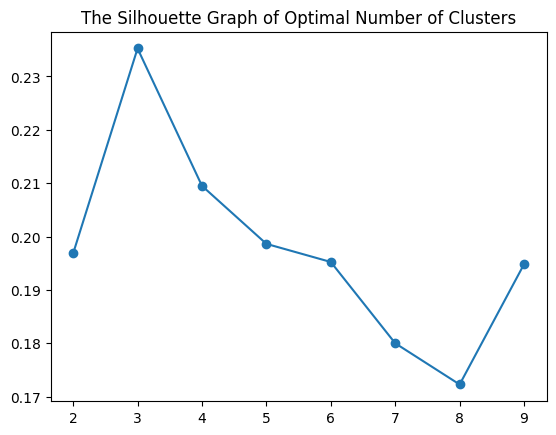

In [149]:
plt.title("The Silhouette Graph of Optimal Number of Clusters")
plt.plot(range(2,10), silhouette_list, marker="o")

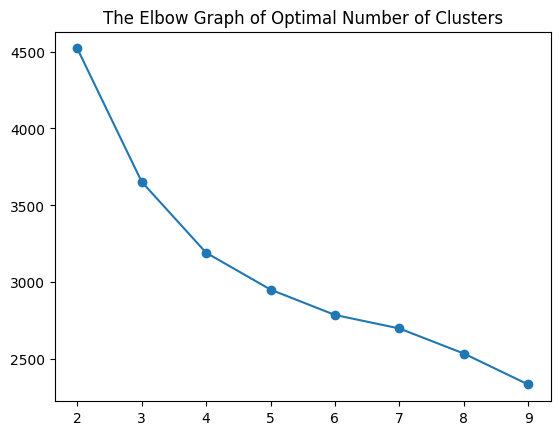

In [150]:
plt.title("The Elbow Graph of Optimal Number of Clusters")
plt.plot(range(2,10), inertia, marker="o")

Another approach to finding the optimal number of clusters is the elbow method. As we can see, the graph levels off at the point where the number of clusters is 3

In [163]:
kmodel = KMeans(n_clusters=3)
predict = kmodel.fit_predict(df_scaled)
df["kmeans"] = predict
df["kmeans"] = df["kmeans"].map({0: 1, 1: 2, 2: 3})
df_enco["kmeans"] = df["kmeans"]
df["kmeans"].value_counts()

kmeans
1    91
3    67
2    44
Name: count, dtype: int64

After predicting with the KMeans algorithm, adjust the cluster labels by adding 1 to each value to avoid having a cluster labeled as 0

### pca to show graph
PCA (Principal Component Analysis) is a technique for dimensionality reduction. It condenses the original 28 columns into just 3 columns, which allows for a 3D plot to visualize the distribution of the data along with its clusters

In [160]:
pca = PCA(n_components=3)
df_pca = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(df_pca, columns=["col1","col2","col3"])
df_pca["kmeans"] = df["kmeans"]
df_pca.head()

,col1,col2,col3,kmeans
0,0.776186,0.570800,-0.265830,3
1,-0.538267,4.354241,0.403911,3
2,-0.750890,2.349635,-0.790571,3
3,-1.662882,-2.029037,-2.139183,1
4,0.830768,0.277034,-2.108704,3


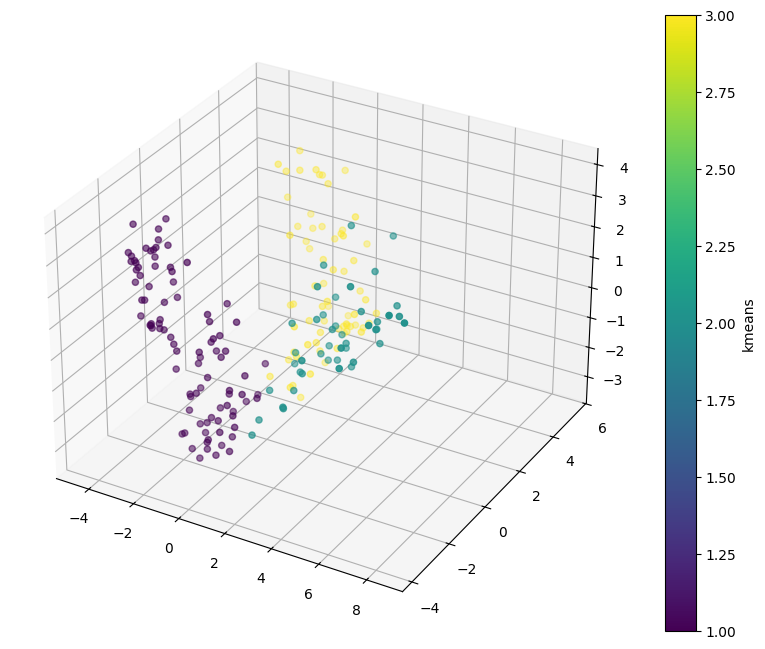

In [165]:
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(df_pca["col1"], df_pca["col2"], df_pca["col3"], cmap="viridis", c=df_pca["kmeans"])

color_bar = fig.colorbar(scatter, ax=ax)
color_bar.set_label("kmeans")

plt.show()

In [161]:
px.scatter_3d(df_pca, x="col1", y="col2", z="col3", color="kmeans")

In [231]:
px.scatter_3d(df_enco, x="Gross_Primary_Education_Enrollment", y="Gross_Tertiary_Education_Enrollment", z="Unemployment_Rate", color="kmeans")

Above is a 3D graph using three random variables from the original dataset along with their clusters. The distribution of clusters appears quite messy because plotting random variables may not always align with the cluster separation observed in PCA. Selecting variables with the highest variance, or those most relevant, is usually more effective, as random selection might lead to less informative plots

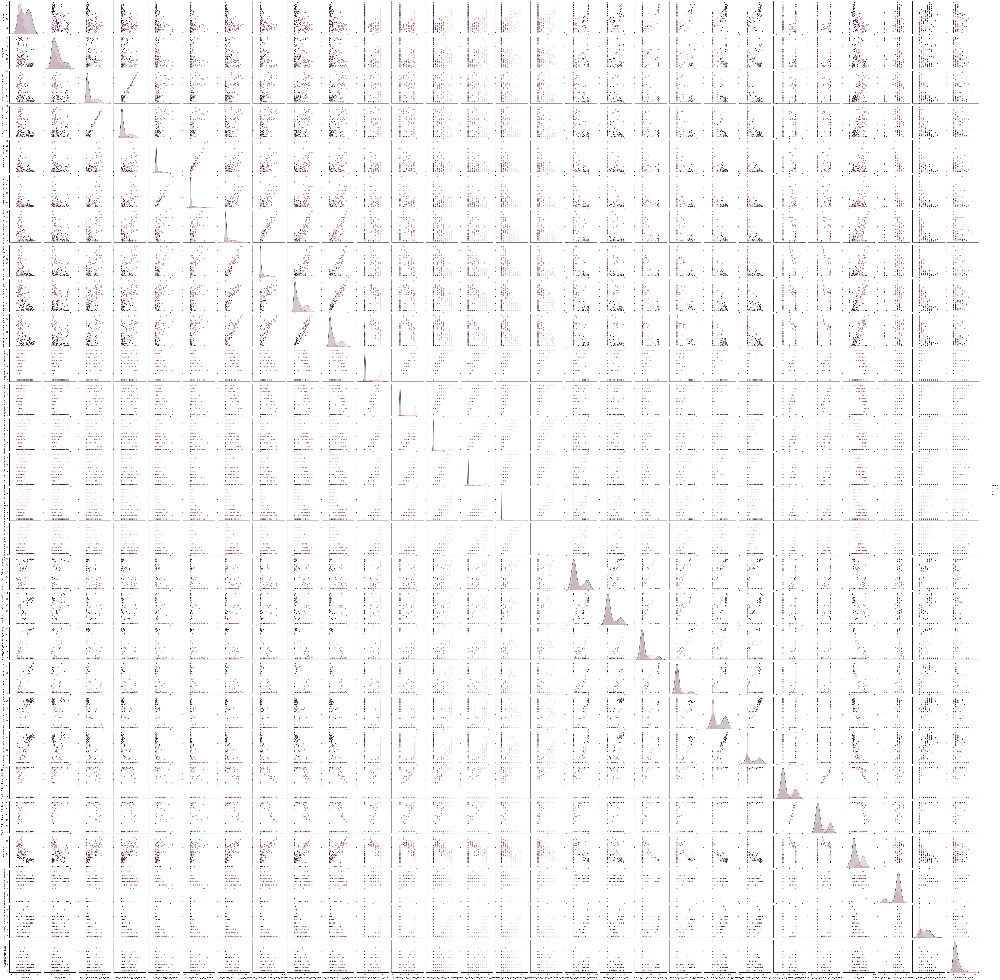

In [94]:
df_enco["kmeans"] = df["kmeans"]
sns.pairplot(df_enco, hue="kmeans")

### Summary for k-mean & Conclusion

In [191]:
print("Countries in Each Cluster\n")
for i in range(1,4):
    print(f"Cluster {i}:", df[df["kmeans"] == i]["Countries and areas"].unique())
    print()

Countries in Each Cluster

Cluster 1: ['Andorra' 'Anguilla' 'Antigua and Barbuda' 'Australia' 'Austria'
 'Azerbaijan' 'The Bahamas' 'Bahrain' 'Belgium' 'Bolivia'
 'British Virgin Islands' 'Brunei' 'Bulgaria' 'Cape Verde' 'Canada'
 'Central African Republic' 'Cook Islands' 'Croatia' 'Cyprus'
 'Czech Republic' 'Denmark' 'Dominica' 'Estonia' 'Fiji' 'Finland' 'France'
 'Germany' 'Greece' 'Grenada' 'Guinea0Bissau' 'Haiti' 'Vatican City'
 'Hungary' 'Iceland' 'Iran' 'Republic of Ireland' 'Israel' 'Italy' 'Japan'
 'Kuwait' 'Latvia' 'Lebanon' 'Libya' 'Liechtenstein' 'Lithuania'
 'Luxembourg' 'Malaysia' 'Maldives' 'Malta' 'Mauritius'
 'Federated States of Micronesia' 'Monaco' 'Montserrat' 'Morocco' 'Nauru'
 'Netherlands' 'New Zealand' 'Nicaragua' 'Niue' 'Norway' 'Oman' 'Palau'
 'Poland' 'Portugal' 'Qatar' 'South Korea' 'Romania' 'Russia'
 'Saint Kitts and Nevis' 'Saint Vincent and the Grenadines' 'Samoa'
 'San Marino' 'Saudi Arabia' 'Seychelles' 'Singapore' 'Slovakia'
 'Slovenia' 'Solomon Island

Here we can see the countries in each cluster. It appears that Cluster 1 mainly contains countries at a middle to developed level of development, while Cluster 2 comprises mostly poorer countries. Cluster 3 includes countries at a middle to lower level of development

In [175]:
summary_numeric = {}

for i in range(4):
    summary_numeric[i] = pd.DataFrame(df_enco[df_enco["kmeans"] == i+1].describe())

print("summary_cluster1")
summary_numeric[0]

summary_cluster1


,Latitude,Longitude,OOSR_Pre0Primary_Age_Male,OOSR_Pre0Primary_Age_Female,OOSR_Primary_Age_Male,OOSR_Primary_Age_Female,OOSR_Lower_Secondary_Age_Male,OOSR_Lower_Secondary_Age_Female,OOSR_Upper_Secondary_Age_Male,OOSR_Upper_Secondary_Age_Female,...,Primary_End_Proficiency_Math,Lower_Secondary_End_Proficiency_Reading,Lower_Secondary_End_Proficiency_Math,Youth_15_24_Literacy_Rate_Male,Youth_15_24_Literacy_Rate_Female,Birth_Rate,Gross_Primary_Education_Enrollment,Gross_Tertiary_Education_Enrollment,Unemployment_Rate,kmeans
count,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,...,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,91.0
mean,31.446833,55.628641,9.604396,8.934066,1.923077,1.648352,2.912088,2.725275,10.109890,9.252747,...,9.000000,38.153846,38.373626,24.428571,24.252747,12.911319,5.780220,2.857143,1.219780,1.0
std,18.097818,50.333171,13.081691,13.352322,3.208429,3.074532,4.927583,4.338627,12.392158,11.682459,...,24.001852,37.810323,36.975562,42.575982,42.562266,8.152875,2.200011,2.302518,1.364651,0.0
min,0.522778,1.521801,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,16.640649,15.190206,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,9.300000,6.000000,1.000000,0.000000,1.0
50%,32.427908,46.199616,5.000000,3.000000,0.000000,0.000000,1.000000,1.000000,5.000000,5.000000,...,0.000000,48.000000,36.000000,0.000000,0.000000,10.900000,6.000000,3.000000,1.000000,1.0
75%,46.522913,72.041572,13.500000,13.500000,2.500000,2.000000,3.000000,3.000000,16.000000,15.500000,...,0.000000,78.000000,78.000000,24.000000,14.500000,16.610000,7.000000,5.000000,2.000000,1.0
max,64.963051,178.065032,65.000000,65.000000,15.000000,15.000000,23.000000,21.000000,53.000000,60.000000,...,89.000000,89.000000,94.000000,100.000000,100.000000,41.750000,8.000000,9.000000,6.000000,1.0


In [176]:
print("summary_cluster2")
summary_numeric[1]

summary_cluster2


,Latitude,Longitude,OOSR_Pre0Primary_Age_Male,OOSR_Pre0Primary_Age_Female,OOSR_Primary_Age_Male,OOSR_Primary_Age_Female,OOSR_Lower_Secondary_Age_Male,OOSR_Lower_Secondary_Age_Female,OOSR_Upper_Secondary_Age_Male,OOSR_Upper_Secondary_Age_Female,...,Primary_End_Proficiency_Math,Lower_Secondary_End_Proficiency_Reading,Lower_Secondary_End_Proficiency_Math,Youth_15_24_Literacy_Rate_Male,Youth_15_24_Literacy_Rate_Female,Birth_Rate,Gross_Primary_Education_Enrollment,Gross_Tertiary_Education_Enrollment,Unemployment_Rate,kmeans
count,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,...,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.0
mean,12.976991,46.575850,49.477273,49.250000,15.613636,17.931818,27.113636,29.318182,49.068182,51.954545,...,4.954545,4.363636,1.931818,35.568182,33.113636,30.376364,6.204545,0.272727,1.363636,2.0
std,8.075471,47.407539,26.700308,26.953125,14.698862,16.004938,16.614950,19.691543,20.904431,23.627885,...,10.532242,13.402691,6.865477,40.871550,39.471636,8.093150,1.593293,0.544043,1.657834,0.0
min,0.186360,0.824782,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.0
25%,7.125989,11.570125,30.250000,29.750000,4.000000,6.000000,16.500000,13.750000,42.000000,40.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,26.247500,5.000000,0.000000,0.000000,2.0
50%,12.402006,32.804252,55.500000,56.000000,11.000000,13.500000,28.000000,29.500000,51.000000,56.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,32.260000,6.000000,0.000000,1.000000,2.0
75%,17.579966,50.394237,71.000000,70.000000,22.750000,23.250000,39.500000,43.250000,63.250000,67.000000,...,3.000000,0.000000,0.000000,74.250000,74.250000,35.105000,7.000000,0.000000,2.000000,2.0
max,34.802075,177.649330,96.000000,96.000000,58.000000,67.000000,61.000000,70.000000,84.000000,89.000000,...,40.000000,59.000000,41.000000,99.000000,99.000000,46.080000,9.000000,2.000000,7.000000,2.0


In [177]:
print("summary_cluster3")
summary_numeric[2]

summary_cluster3


,Latitude,Longitude,OOSR_Pre0Primary_Age_Male,OOSR_Pre0Primary_Age_Female,OOSR_Primary_Age_Male,OOSR_Primary_Age_Female,OOSR_Lower_Secondary_Age_Male,OOSR_Lower_Secondary_Age_Female,OOSR_Upper_Secondary_Age_Male,OOSR_Upper_Secondary_Age_Female,...,Primary_End_Proficiency_Math,Lower_Secondary_End_Proficiency_Reading,Lower_Secondary_End_Proficiency_Math,Youth_15_24_Literacy_Rate_Male,Youth_15_24_Literacy_Rate_Female,Birth_Rate,Gross_Primary_Education_Enrollment,Gross_Tertiary_Education_Enrollment,Unemployment_Rate,kmeans
count,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,...,67.00000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.0
mean,24.385043,60.181727,13.731343,13.656716,3.059701,2.776119,4.492537,3.671642,15.223881,13.537313,...,15.80597,23.059701,20.328358,51.402985,51.089552,19.539403,6.298507,1.940299,2.208955,3.0
std,14.757639,37.994388,20.950578,20.848336,4.728638,4.188082,5.671228,4.875381,13.809111,14.090969,...,25.09270,27.607026,24.375465,48.258791,48.227595,9.278804,1.749588,1.695633,1.950426,0.0
min,0.023559,1.023194,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0
25%,13.006809,27.901361,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,13.665000,6.000000,0.500000,1.000000,3.0
50%,23.442503,59.556278,4.000000,3.000000,1.000000,1.000000,2.000000,1.000000,15.000000,13.000000,...,0.00000,0.000000,2.000000,82.000000,85.000000,18.180000,7.000000,2.000000,2.000000,3.0
75%,38.638565,80.776962,20.000000,20.000000,3.000000,3.000000,7.500000,7.000000,23.500000,21.000000,...,27.50000,48.000000,40.000000,99.000000,99.000000,25.600000,7.000000,3.000000,3.000000,3.0
max,53.709807,175.198242,87.000000,88.000000,19.000000,17.000000,19.000000,17.000000,47.000000,69.000000,...,80.00000,86.000000,81.000000,100.000000,100.000000,41.180000,9.000000,6.000000,9.000000,3.0


- From the summary tables, there are 91 countries in Cluster 1, 44 countries in Cluster 2, and 67 countries in Cluster 3.

- The summaries don’t all seem relevant. For instance, the initial OOSR_ columns, which represent the percentage of people who don't enroll in school, show that Cluster 1 has the lowest mean, while Cluster 2 has the highest. This aligns well with the previous conclusion about the types of countries in each cluster.
- However, there are some irrelevant results as well. For example, in the columns for "Youth_15_24_Literacy_Rate_Male" and "Youth_15_24_Literacy_Rate_Female," Cluster 1, which mostly contains middle-to-upper developed countries, shows very low literacy rates. Conversely, Cluster 2, which primarily consists of poorer countries, shows higher literacy rates. This information seems inaccurate and inconsistent.

In [194]:
summary_object = {}

for i in range(4):
    summary_object[i] = pd.DataFrame(df[df["kmeans"] == i+1].describe(include=["object"]))

print("summary_cluster1")
summary_object[0]

summary_cluster1


,Countries and areas,Completion_Rate_Primary_Male,Completion_Rate_Primary_Female,Completion_Rate_Lower_Secondary_Male,Completion_Rate_Lower_Secondary_Female,Completion_Rate_Upper_Secondary_Male,Completion_Rate_Upper_Secondary_Female,Gross_Primary_Education_Enrollment,Gross_Tertiary_Education_Enrollment,Unemployment_Rate
count,91,91,91,91,91,91,91,91,91,91
unique,91,5,5,4,4,2,2,6,10,7
top,Andorra,extremely low,extremely low,extremely low,extremely low,extremely low,extremely low,very high,extremely low,extremely low
freq,1,87,87,87,88,88,89,41,22,32


In [197]:
print("summary_cluster2")
summary_object[1]

summary_cluster2


,Countries and areas,Completion_Rate_Primary_Male,Completion_Rate_Primary_Female,Completion_Rate_Lower_Secondary_Male,Completion_Rate_Lower_Secondary_Female,Completion_Rate_Upper_Secondary_Male,Completion_Rate_Upper_Secondary_Female,Gross_Primary_Education_Enrollment,Gross_Tertiary_Education_Enrollment,Unemployment_Rate
count,44,44,44,44,44,44,44,44,44,44
unique,44,8,10,7,7,5,5,7,3,7
top,Benin,extremely low,extremely low,moderate,extremely low,very low,extremely low,very high,extremely low,extremely low
freq,1,8,8,9,12,14,18,13,34,18


In [1]:
pip install --upgrade nbformat nbconvert


  Using cached jinja2-3.1.4-py3-none-any.whl.metadata (2.6 kB)
  Using cached MarkupSafe-2.1.5-cp312-cp312-macosx_10_9_universal2.whl.metadata (3.0 kB)
Using cached jinja2-3.1.4-py3-none-any.whl (133 kB)
Using cached MarkupSafe-2.1.5-cp312-cp312-macosx_10_9_universal2.whl (18 kB)
Note: you may need to restart the kernel to use updated packages.


In [196]:
print("summary_cluster3")
summary_object[2]

summary_cluster3


,Countries and areas,Completion_Rate_Primary_Male,Completion_Rate_Primary_Female,Completion_Rate_Lower_Secondary_Male,Completion_Rate_Lower_Secondary_Female,Completion_Rate_Upper_Secondary_Male,Completion_Rate_Upper_Secondary_Female,Gross_Primary_Education_Enrollment,Gross_Tertiary_Education_Enrollment,Unemployment_Rate
count,67,67,67,67,67,67,67,67,67,67
unique,67,4,6,7,8,9,10,6,7,8
top,Afghanistan,ultra high,ultra high,ultra high,ultra high,moderate,very high,very high,extremely low,very low
freq,1,48,50,23,29,13,11,33,17,20


In [192]:
print("Unique Object Column Values for Each Cluster\n")

columns = [col for col in df.columns if df[col].dtype == "object" and col != "Countries and areas"]
for i in range(1,4):
    print(f"Cluster {i}:")
    for col in columns:
        print(f"{col}: {df[df['kmeans'] == i][col].unique()}")
    print()
    

Unique Object Column Values for Each Cluster

Cluster 1:
Completion_Rate_Primary_Male: ['extremely low' 'moderately high' 'low' 'moderate' 'moderately low']
Completion_Rate_Primary_Female: ['extremely low' 'moderately low' 'low' 'moderately high' 'moderate']
Completion_Rate_Lower_Secondary_Male: ['extremely low' 'very low' 'moderately low' 'low']
Completion_Rate_Lower_Secondary_Female: ['extremely low' 'very low' 'moderately low' 'low']
Completion_Rate_Upper_Secondary_Male: ['extremely low' 'very low']
Completion_Rate_Upper_Secondary_Female: ['extremely low' 'very low']
Gross_Primary_Education_Enrollment: ['very high' 'extremely low' 'high' 'moderately high' 'extremely high'
 'very low']
Gross_Tertiary_Education_Enrollment: ['extremely low' 'very low' 'extremely high' 'high' 'moderately low'
 'moderately high' 'low' 'moderate' 'ultra high' 'very high']
Unemployment_Rate: ['extremely low' 'very low' 'moderately low' 'moderate' 'low'
 'moderately high' 'high']

Cluster 2:
Completion_Rate

Based on the object type summaries, the irrelevant information is reinforced by the unmatched completion rates for each cluster. Middle-to-upper developed countries are assigned low completion rates, while other types of countries have higher completion rates

### Reasons?
- Potentially this discrepancy might include the presence of many zeros or empty values in the original DataFrame, which could lead to inaccurate clustering results. as it proves by the output below

ps: Actually i didnt realize the great amount of 0 values in this dataframe, i just discovered it after analyzing the output, if i had known it earlier, i wouldnt have used this data


In [22]:
for col in df.iloc[:, 1:].columns:
    print(col)
    print((df[col] == 0).sum())

Latitude 
0
Longitude
0
OOSR_Pre0Primary_Age_Male
52
OOSR_Pre0Primary_Age_Female
55
OOSR_Primary_Age_Male
80
OOSR_Primary_Age_Female
85
OOSR_Lower_Secondary_Age_Male
74
OOSR_Lower_Secondary_Age_Female
75
OOSR_Upper_Secondary_Age_Male
51
OOSR_Upper_Secondary_Age_Female
51
Completion_Rate_Primary_Male
0
Completion_Rate_Primary_Female
0
Completion_Rate_Lower_Secondary_Male
0
Completion_Rate_Lower_Secondary_Female
0
Completion_Rate_Upper_Secondary_Male
0
Completion_Rate_Upper_Secondary_Female
0
Grade_2_3_Proficiency_Reading
131
Grade_2_3_Proficiency_Math
142
Primary_End_Proficiency_Reading
158
Primary_End_Proficiency_Math
153
Lower_Secondary_End_Proficiency_Reading
116
Lower_Secondary_End_Proficiency_Math
111
Youth_15_24_Literacy_Rate_Male
123
Youth_15_24_Literacy_Rate_Female
123
Birth_Rate
13
Gross_Primary_Education_Enrollment
0
Gross_Tertiary_Education_Enrollment
0
Unemployment_Rate
0


### Hierarichal clustering

In [204]:
silhouette_list=[]

for k in range(2,10):
    hier_model = AgglomerativeClustering(n_clusters=k)
    hier_model = hier_model.fit_predict(df_scaled)
    silhouette_avg = silhouette_score(df_scaled, hier_model)
    
    print(f"nilai k: {k} dengan score {silhouette_avg}")
    silhouette_list.append(silhouette_avg)

best_k = np.argmax(silhouette_list)
print(f"best k:{best_k+2} dengan nilai {silhouette_list[best_k]} ")

nilai k: 2 dengan score 0.18049019075197886
nilai k: 3 dengan score 0.21483419202516793
nilai k: 4 dengan score 0.19523843196132135
nilai k: 5 dengan score 0.18093273217491712
nilai k: 6 dengan score 0.16847136781451916
nilai k: 7 dengan score 0.17366371077762002
nilai k: 8 dengan score 0.19131157052149986
nilai k: 9 dengan score 0.195525144050174
best k:3 dengan nilai 0.21483419202516793 


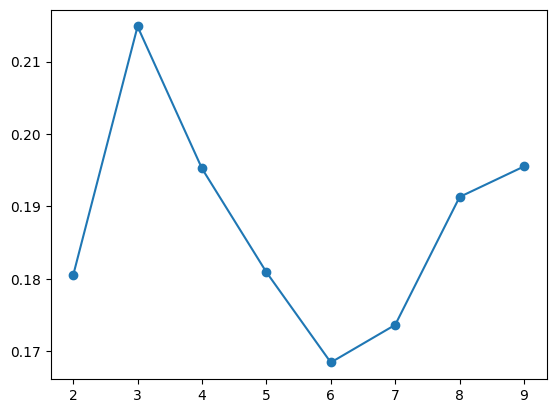

In [205]:
plt.plot(range(2,10), silhouette_list, marker="o")

In [206]:
hier_model = AgglomerativeClustering(n_clusters=3)
predict = hier_model.fit_predict(df_scaled)
df["hier"] = predict
df["hier"] = df["hier"].map({0: 1, 1: 2, 2: 3})
df_enco["hier"] = df["hier"]
df["hier"].value_counts()

hier
1    109
3     54
2     39
Name: count, dtype: int64

there're 109 countries in cluster1, 54 countries in cluster3 and 39 countries in cluster2

In [209]:
df_pca["hier"] = df["hier"]
df_pca.head()

,col1,col2,col3,kmeans,hier
0,0.776186,0.570800,-0.265830,3,2
1,-0.538267,4.354241,0.403911,3,3
2,-0.750890,2.349635,-0.790571,3,1
3,-1.662882,-2.029037,-2.139183,1,1
4,0.830768,0.277034,-2.108704,3,1


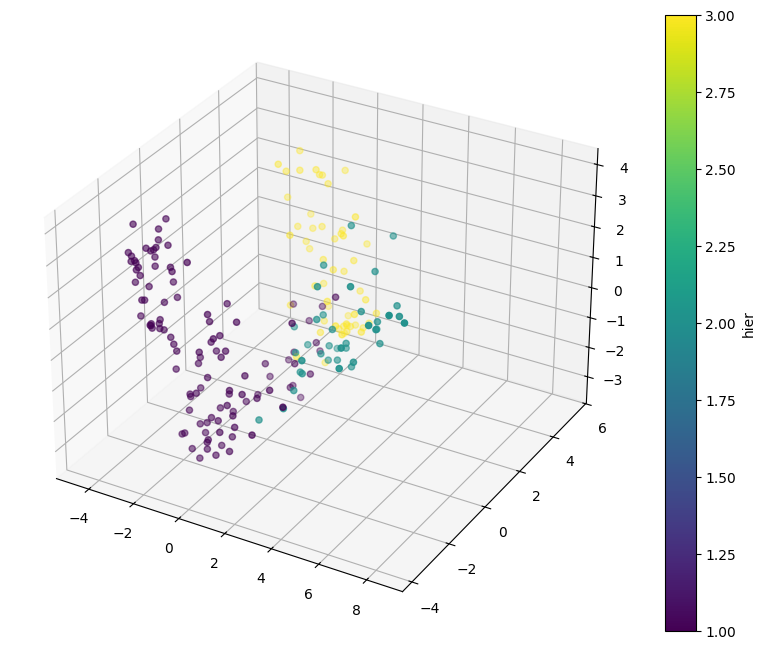

In [210]:
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(df_pca["col1"], df_pca["col2"], df_pca["col3"], cmap="viridis", c=df_pca["hier"])

color_bar = fig.colorbar(scatter, ax=ax)
color_bar.set_label("hier")

plt.show()

In [211]:
px.scatter_3d(df_pca, x="col1", y="col2", z="col3", color="hier")

Judging by the results, it appears that the hierarchical clustering graph performs worse compared to k-means clustering

In [224]:
print("Countries in Each Cluster\n")
for i in range(1,4):
    print(f"Cluster {i}:", df[df["hier"] == i]["Countries and areas"].unique())
    print()

Countries in Each Cluster

Cluster 1: ['Algeria' 'Andorra' 'Angola' 'Anguilla' 'Antigua and Barbuda' 'Australia'
 'Austria' 'Azerbaijan' 'The Bahamas' 'Bahrain' 'Belgium' 'Bolivia'
 'British Virgin Islands' 'Brunei' 'Bulgaria' 'Cape Verde' 'Cambodia'
 'Canada' 'Central African Republic' 'Republic of the Congo'
 'Cook Islands' 'Croatia' 'Cyprus' 'Czech Republic'
 'Democratic Republic of the Congo' 'Denmark' 'Dominica'
 'Equatorial Guinea' 'Estonia' 'Fiji' 'Finland' 'France' 'Gabon'
 'The Gambia' 'Germany' 'Greece' 'Grenada' 'Guinea0Bissau' 'Haiti'
 'Vatican City' 'Hungary' 'Iceland' 'Iran' 'Iraq' 'Republic of Ireland'
 'Israel' 'Italy' 'Japan' 'Kenya' 'Kiribati' 'Kuwait' 'Latvia' 'Lebanon'
 'Libya' 'Liechtenstein' 'Lithuania' 'Luxembourg' 'Malaysia' 'Maldives'
 'Malta' 'Mauritius' 'Federated States of Micronesia' 'Monaco'
 'Montserrat' 'Morocco' 'Namibia' 'Nauru' 'Netherlands' 'New Zealand'
 'Nicaragua' 'Nigeria' 'Niue' 'Norway' 'Oman' 'Pakistan' 'Palau' 'Poland'
 'Portugal' 'Qatar' 'So

### DBSCAN clustering

In [24]:
param_grid = {
    'eps': np.arange(0.1,3.0,0.1),
    'min_samples': np.arange(1,10,1)
}
best_params=None
best_score=0

for params in ParameterGrid(param_grid):
    dbscan_model = DBSCAN(eps=params['eps'], min_samples=params["min_samples"])
    dbscan_model = dbscan_model.fit_predict(df_scaled)
    
    if (len(np.unique(dbscan_model)) > 1) and (len(np.unique(dbscan_model)) < len(df_scaled)):
        score = silhouette_score(df_scaled, dbscan_model)
        if score > best_score:
            best_score = score
            best_params = params
        
print("parameter terbaik: ")
print("best eps: ", best_params["eps"])
print("best min_samples: ", best_params["min_samples"])
print("best score: ", best_score)

parameter terbaik: 
best eps:  2.0
best min_samples:  1
best score:  0.12451274499226685


For the DBSCAN technique, instead of determining the best number of clusters,it needs to decide on the optimal values for eps and min_samples. Both of these parameters can be tuned using the same method which is silhouette score

In [45]:
dbscan_model = DBSCAN(eps=2.0, min_samples=1)
predict = dbscan_model.fit_predict(df_scaled)

df["dbscan"] = predict
print(df["dbscan"].value_counts())

dbscan
43     8
25     6
17     6
5      5
23     4
      ..
53     1
52     1
51     1
50     1
157    1
Name: count, Length: 158, dtype: int64


In [ ]:
df_enco["dbscan"] = df["dbscan"]
df_pca["dbscan"] = df["dbscan"]
df_pca.head()

In [28]:
px.scatter_3d(df_pca, x="col1", y="col2", z="col3", color="dbscan")

In [38]:
print("Countries in Each Cluster\n")
for i in range(1,df["dbscan"].nunique()):
    print(f"Cluster {i}:", df[df["dbscan"] == i]["Countries and areas"].unique())
    print()

Countries in Each Cluster

Cluster 1: ['Albania' 'Montenegro']

Cluster 2: ['Algeria']

Cluster 3: ['Andorra' 'Liechtenstein']

Cluster 4: ['Angola']

Cluster 5: ['Anguilla' 'British Virgin Islands' 'Vatican City' 'Monaco'
 'Turks and Caicos Islands']

Cluster 6: ['Antigua and Barbuda' 'Bolivia' 'Dominica' 'Maldives']

Cluster 7: ['Argentina' 'Uruguay']

Cluster 8: ['Armenia']

Cluster 9: ['Australia']

Cluster 10: ['Austria']

Cluster 11: ['Azerbaijan']

Cluster 12: ['The Bahamas']

Cluster 13: ['Bahrain' 'Oman']

Cluster 14: ['Bangladesh']

Cluster 15: ['Barbados']

Cluster 16: ['Belarus']

Cluster 17: ['Belgium' 'Estonia' 'Iceland' 'Luxembourg' 'Switzerland' 'United Kingdom']

Cluster 18: ['Belize']

Cluster 19: ['Benin']

Cluster 20: ['Bhutan']

Cluster 21: ['Bosnia and Herzegovina']

Cluster 22: ['Botswana']

Cluster 23: ['Brazil' 'Colombia' 'Costa Rica' 'Peru']

Cluster 24: ['Brunei']

Cluster 25: ['Bulgaria' 'France' 'Germany' 'Hungary' 'Lithuania' 'Slovakia']

Cluster 26: ['Bur

Based on the results of DBSCAN clustering, there are some insights to be gained, as shown below:
- This DBSCAN technique doesn't provide an optimal clustering result, as indicated by the numerous clusters with a messy distribution in the graph.
- Countries in clusters by themselves (e.g., Cluster 2 with Algeria or Cluster 4 with Angola) could be seen as outliers, suggesting they have unique characteristics not shared with other countries in the dataset.
- Cluster 17 (Belgium, Estonia, Iceland, Luxembourg, Switzerland, United Kingdom) consists of European countries with strong economies and high standards of living. This suggests that economic and geographic factors might play a significant role in shaping their education outcomes, particularly in terms of literacy rates, school completion rates, and overall education enrollment.
-  The other examples related are Cluster 43 includes Nordic and Central European countries (Czech Republic, Denmark, Finland, Ireland, Netherlands, Poland, Slovenia, Sweden) Cluster 23 (Brazil, Colombia, Costa Rica, Peru) groups South American countries and Cluster 72 (Italy, Portugal, Spain)

### Reasons?
Due to the same factors mentioned earlier in the K-means clustering explanation